# Create and Find Images with Stable Diffusion and Florence Vector Search

Welcome to our notebook on Synthetic Image Creation and Search. In this notebook, we'll guide you through a comprehensive demonstration of clustering and searching for images semantically, using embeddings derived from the Florence Foundation model. The techniques presented here are incredibly versatile and can be applied in the following ways:

To discover or group images by visual similarity, enabling intuitive organization and retrieval of visual data.
To locate specific images using a text description, a feature particularly beneficial when dealing with large image databases.
To exemplify these applications, we're utilizing images from three distinct categories: 1) Female Individuals, 2) Male Individuals, and 3) Animals.

If you have your own collection of images representing different classes similar to the examples above, these can be organized in subfolders within the `./source` directory. It is recommended that the names of these subfolders accurately reflect the nature of the classes they represent.

However, if you're starting without a pre-existing set of images, don't fret! The first section of this notebook is dedicated to guiding you through the process of creating synthetic images using the Stable Diffusion technique. By the end of this notebook, you will not only have a collection of synthetic images but also the ability to effectively manage and search through them using the power of the Florence Foundation model.

## General Imports and Helper Functions

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import math
import requests
from io import BytesIO

In [ ]:
def show_images(images, cols=2, source='url', savedir=''):
    """
    Get images from URL and display them in a grid. Optionally save or retrieve images to/from local dir. 
    
    Parameters
    ----------
    images : list
        List of image urls or local file paths.
    cols : int
        Number of columns in the grid.
    source : str
        'url' or 'local'
    savedir : str
        Directory to save images to.
    """
    
    if savedir != '':
        os.makedirs(savedir, exist_ok=True)
        
    rows = int(math.ceil(len(images) / cols))

    fig = plt.figure(figsize=(cols * 7, rows * 5)) # specifying the overall grid size

    for i, image_url in enumerate(images):
        plt.subplot(rows, cols,i+1)  
        
        if source == 'url':
            response = requests.get(image_url)
            img = Image.open(BytesIO(response.content))
            
            # save images if savedir is specified
            if savedir != '':
                
                # get list of png files
                png_filenames = [image for image in os.listdir(savedir) if image.endswith('.png')]
                # get highest index from existing files
                if png_filenames == []:
                    max_index = 0
                else:
                    max_index = max([int(filename.strip('.png')) for filename in png_filenames])

                # save new file with index + 1
                new_filename = f'{max_index+1:03d}.png'
                fp = os.path.join(savedir, new_filename)
                img.save(fp, 'PNG')            
            
        else: 
            img = Image.open(image_url) # local file
            # plt.title(image_url)

        plt.imshow(img)
        plt.axis('off')

    fig.tight_layout()

    plt.show()

# Part I: Create Synthetic Images of Men, Women and Animals
__Note:__ This is an optional step if you don't want to bring your own sample images.

In [14]:
from diffusers import StableDiffusionPipeline, AutoencoderKL,  DPMSolverMultistepScheduler
import torch
import random
from IPython.display import display

In [23]:
# Central variables for image generation:

classes = ['man', 'woman', 'animal'] # classes to generate 
root = './genimages' # root folder for generated images
images_per_class = 100

Feel free to experiment with different models like `Realistic Vision 2.0` or `Stable Diffusion 2.1`. We have generated images of individuals using the Realistic Vision model. For animals, we have chosen Stable Disffusion 2.1.

In [ ]:
# for using Realistic Vision 2.0
# pipe = StableDiffusionPipeline.from_pretrained("SG161222/Realistic_Vision_V2.0",
#                                                torch_dtype=torch.float16,
#                                                safety_checker=None,
#                                                )


# for using Stable Diffusuin 2.1
pipe = StableDiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2-1",
                                              # torch_dtype=torch.float16,
                                               safety_checker=None,
                                               )

pipe.to('cuda')

In [ ]:
def generate_prompt(classname):

    shot = random.choice(['Long shot', 'Full shot', 'Medium shot', 'Close up'])
    medium = random.choice(['raw photo'])
    age = random.choice(['young', 'middle aged', 'senior']) 
    origin = random.choice(['German', 'European', 'English', 'Spanish', 'American', 'African', 'Asian'])
    dressed = random.choice(['casually', 'business formally', 'black tied'])
    male_role = random.choice(['businessman', 'male tourist', 'man']) 
    female_role = random.choice(['businesswoman', 'female tourist', 'woman']) 
    doing = random.choice(['walking in a busy city', 'in a business meeting', 'eating in a restaurant', 'talking to coworkers', 'bicycling', 'driving a a convertible', 'walking in a park'])
    animal_scene = random.choice([
        'lion running in the steppe', 
        'eagle flying in the sky',
        'dolphins leaping in the ocean',
        'a herd of elephants marching through the savannah',
        'monkeys swinging through the rainforest',
        'penguins waddling on the Antarctic ice',
        'a kangaroo hopping in the Australian outback',
        'a polar bear hunting in the Arctic',
        'a snake slithering in the desert',
        'a group of ants marching in the forest',
        'a deer grazing in the meadow',
        'a colony of bats flying out of a cave',
        'a wolf pack howling at the moon in the tundra',
        'a tortoise slowly walking on a sunny beach',
        'a squirrel darting up a tree in the park',
        'an octopus swimming in the deep sea',
        'a butterfly fluttering in a blooming garden'
    ])

    if classname == 'man':
        prompt = f'{shot} {medium} of {age} {dressed} dressed {origin} {male_role} {doing}'
    if classname == 'woman':
        prompt = f'{shot} {medium} of {age} {dressed} dressed {origin} {female_role} {doing}'
    if classname == 'animal':
        prompt = f'{shot} {medium} of {animal_scene}'

    return prompt

def generate_images(prompt, num_images=1):

    suffix = ", (high detailed skin:1.2), 8k uhd, dslr, high quality, film grain, real-world, unedited, photorealistic, Fujifilm XT3, natural, authentic"
    negative_prompt = '(semi-realistic, cgi, 3d, render, sketch, cartoon, drawing, anime:1.4), text, close up, cropped, out of frame, worst quality, low quality, jpeg artifacts, ugly, duplicate, morbid, mutilated, extra fingers, mutated hands, poorly drawn hands, poorly drawn face, mutation, deformed, blurry, dehydrated, bad anatomy, bad proportions, extra limbs, cloned face, disfigured, gross proportions, malformed limbs, missing arms, missing legs, extra arms, extra legs, fused fingers, too many fingers, long neck'

    images = pipe(prompt=prompt + suffix,
                negative_prompt=negative_prompt,
                height=512,
                width=768,
                guidance_scale=7.5,
                num_inference_steps=50,
                num_images_per_prompt=num_images,
                ).images
    
    return images

for classname in classes:
    image_path = os.path.join(root, classname)
    # create the directory if it doesn't exist
    if not os.path.exists(image_path):
        os.makedirs(image_path)

    for image_idx in range(images_per_class):
        prompt = generate_prompt(classname)
        # print(prompt)
        image = generate_images(prompt)[0]

        rand_num = random.randint(100000, 999999)
        image.save(os.path.join(image_path, f"image-{rand_num}.png"))

## Review Samples of generated Images

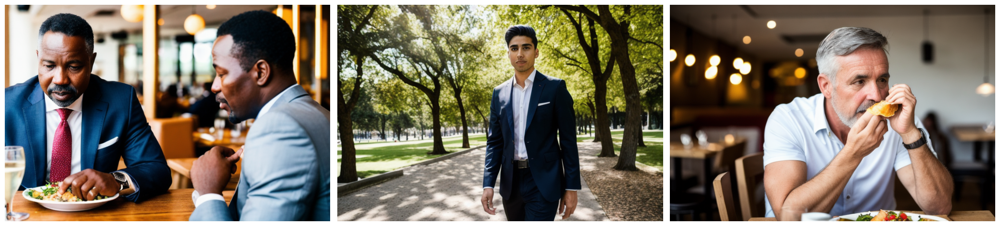

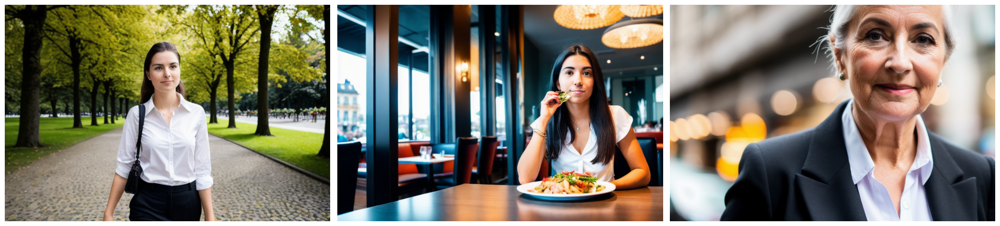

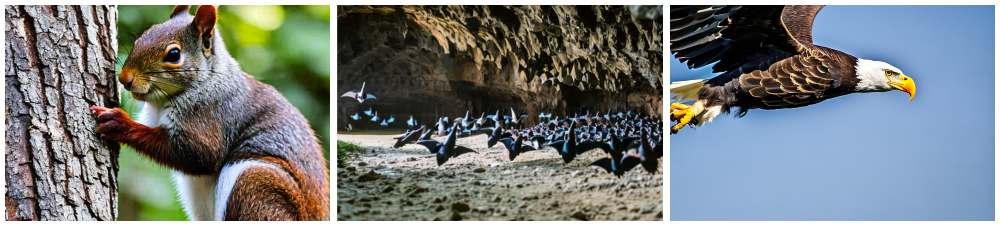

In [25]:
samples_per_class = 3

for classname in classes:
    image_path = os.path.join(root, classname)
    image_list = [os.path.join(image_path, image) for image in os.listdir(image_path) if image.endswith('.png')]

    show_images(images=image_list[:samples_per_class], cols=3, source='local')

# Part II: Generate Image Embeddings for Clustering and Image Search

In [26]:
import plotly.express as px
from sklearn.manifold import TSNE
from dotenv import load_dotenv
import json

import azure.ai.vision as sdk
import pandas as pd
import numpy as np
from tenacity import retry, stop_after_attempt, wait_random_exponential

In [29]:
# Central variables image search:

load_dotenv('../.env')

# Azure Computer Vision
key = os.getenv("azure_cv_key")
endpoint = os.getenv("azure_cv_endpoint")

image_root = './genimages/' # using synthetic images

In [30]:
@retry(wait=wait_random_exponential(min=1, max=60), stop=stop_after_attempt(6)) # automatic retry in case of a failing API call
def get_embedding(imagefile):
    """
    Get embedding from an image using Azure Computer Vision 4
    """
    # settings
    model = "?api-version=2023-02-01-preview&modelVersion=latest"
    url = endpoint + "/computervision/retrieval:vectorizeImage" + model
    headers = {
        "Content-type": "application/octet-stream",
        "Ocp-Apim-Subscription-Key": key,
    }

    # Read the image file
    with open(imagefile, "rb") as f:
        data = f.read()

    # Sending the requests
    r = requests.post(url, data=data, headers=headers)
    results = r.json()
    embeddings = results['vector']

    return embeddings

def get_text_embedding(text):
    """
    Get embedding from text using Azure Computer Vision 4
    """

    # settings
    options = "&features=caption,tags"
    model = "?api-version=2023-02-01-preview&modelVersion=latest"
    url = endpoint + "/computervision/retrieval:vectorizeText" + model # + options
    headers = {
        "Content-type": "application/json",
        "Ocp-Apim-Subscription-Key": key,
    }

    data = {
        "text": text
    }

    # Sending the requests
    r = requests.post(url, data=json.dumps(data), headers=headers)
    results = r.json()
    embeddings = results['vector']

    return embeddings

def get_cosine_similarity(vector1, vector2):
    """
    Calculate cosine similarity of two embeddings vectors
    """
    dot_product = sum(a*b for a, b in zip(vector1, vector2))
    magnitude1 = math.sqrt(sum((val*val) for val in vector1))
    magnitude2 = math.sqrt(sum((val*val) for val in vector2))
    return dot_product / (magnitude1 * magnitude2)

## Create a dataframe of image name, class and embeddings

In [33]:
df = pd.DataFrame(columns=['file', 'class', 'embedding'])

idx = 0
for root, dirs, files in os.walk(image_root):
    for dir in dirs:
        print(f"Subfolder: {dir}")
        subdir = os.path.join(root, dir)
        for file in os.listdir(subdir):
            if file.endswith('.png') or file.endswith('.jpg'):
                # print(f"Image file: {file}")
                full_path = os.path.join(image_root, dir, file)

                embedding = get_embedding(imagefile=full_path)

                row = [full_path, dir, embedding]
                df.loc[idx] = row
                idx += 1

Subfolder: woman
Subfolder: man
Subfolder: animal


In [34]:
display(df.sample(6))

,file,class,embedding
74,./genimages/woman/image-127498.png,woman,"[2.6894531, -1.4335938, 0.21386719, 1.0888672,..."
95,./genimages/woman/image-593150.png,woman,"[2.2148438, -2.5390625, -0.8256836, 0.99316406..."
159,./genimages/man/image-271134.png,man,"[0.10015869, 0.5361328, 0.8251953, -0.10559082..."
34,./genimages/woman/image-218068.png,woman,"[0.62646484, 1.6923828, -1.0888672, 0.46606445..."
196,./genimages/man/image-820908.png,man,"[-1.0917969, -0.75, -1.3017578, -1.0068359, 4...."
144,./genimages/man/image-753343.png,man,"[2.5390625, 0.92333984, 1.9443359, 1.0761719, ..."


In [36]:
# optionally save dataframe for later reuse. Pickle format selcted to preserve embeddings data type
# df.to_pickle('./men-women-animals-embeddings-sd-gen-300.pkl')

# reload
# df = pd.read_pickle('men-women-animals-embeddings-sd-gen-300.pkl')

## Reducing embeddings dimensions for 2D and 3D visualization

In [38]:
# Convert to a list of lists of floats
matrix = df.embedding.to_list()
matrix = np.array(matrix)

# Create a t-SNE model and transform the data
tsne = TSNE(n_components=2, perplexity=15, random_state=42, init='random', learning_rate=200)
vis_dims = tsne.fit_transform(matrix)
vis_dims.shape

# add t-SNE dimensions to the dataframe
df['dim1of2'] = vis_dims[:,0]
df['dim2of2'] = vis_dims[:,1]

# Create a t-SNE model and transform the data
tsne = TSNE(n_components=3, perplexity=15, random_state=42, init='random', learning_rate=200)
vis_dims = tsne.fit_transform(matrix)
vis_dims.shape

# add t-SNE dimensions to the dataframe
df['dim1of3'] = vis_dims[:,0]
df['dim2of3'] = vis_dims[:,1]
df['dim3of3'] = vis_dims[:,2]

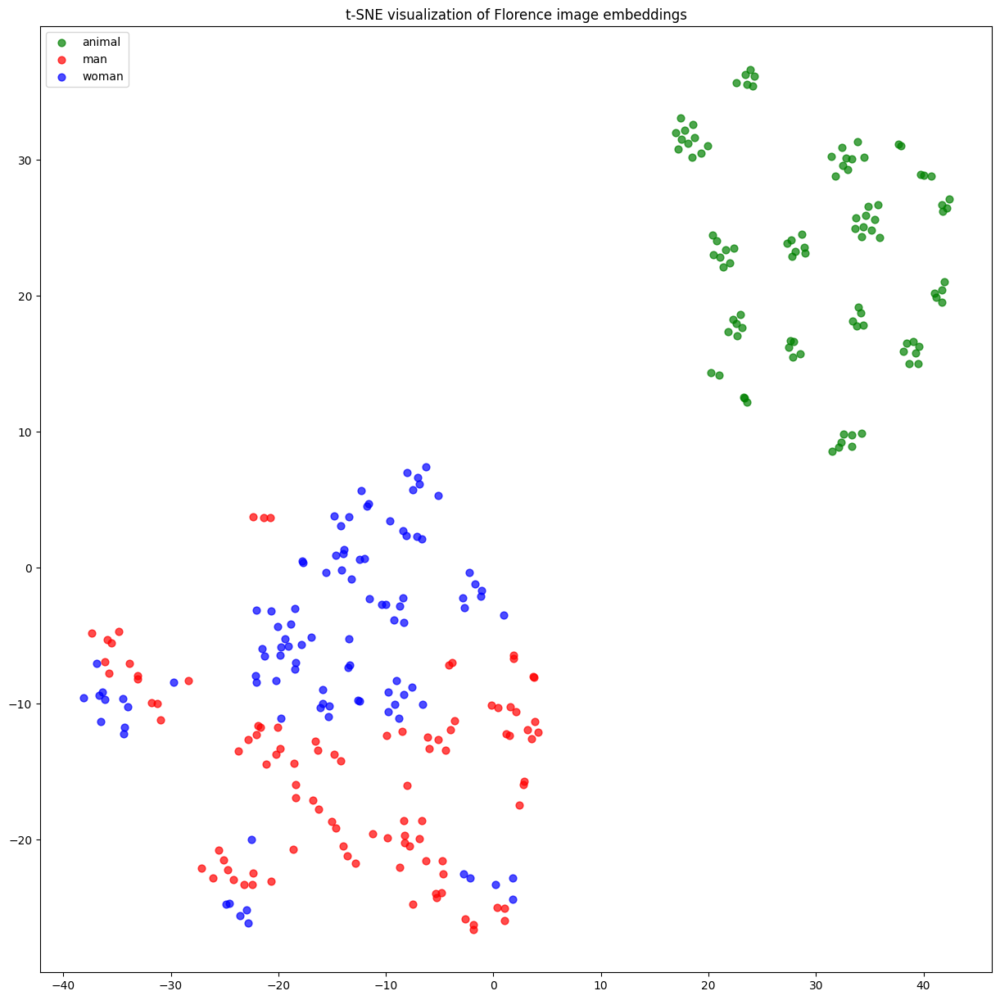

In [43]:
# plot the t-SNE embeddings
cat2col = {'woman': 'blue', 'man': 'red', 'animal': 'green'}

fig,ax = plt.subplots(figsize=(15,15))
for k,d in df.groupby('class'):
    ax.scatter(d['dim1of2'], d['dim2of2'], label=k, alpha=0.7, s=40, c=cat2col[k])
plt.title('t-SNE visualization of Florence image embeddings')
plt.legend(loc=2)

plt.show()

In [40]:
df['size'] = 0.8

fig = px.scatter_3d(df,
                    x='dim1of3', y='dim2of3', z='dim3of3',
                    hover_name = 'file',
                    color='class',
                    size_max = 15,
                    size='size',
                    opacity=0.0,
                    width = 1800, height = 920)

fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
# fig.write_html("topics.html")
fig.show()

## Image Search

,file,class,similarity
1,./genimages/woman/image-497621.png,woman,0.373920
99,./genimages/woman/image-335929.png,woman,0.362877
33,./genimages/woman/image-488695.png,woman,0.349007
49,./genimages/woman/image-824620.png,woman,0.338750
34,./genimages/woman/image-218068.png,woman,0.336847
91,./genimages/woman/image-541638.png,woman,0.328781
192,./genimages/man/image-737009.png,man,0.275946
145,./genimages/man/image-437070.png,man,0.270618
28,./genimages/woman/image-818427.png,woman,0.267260


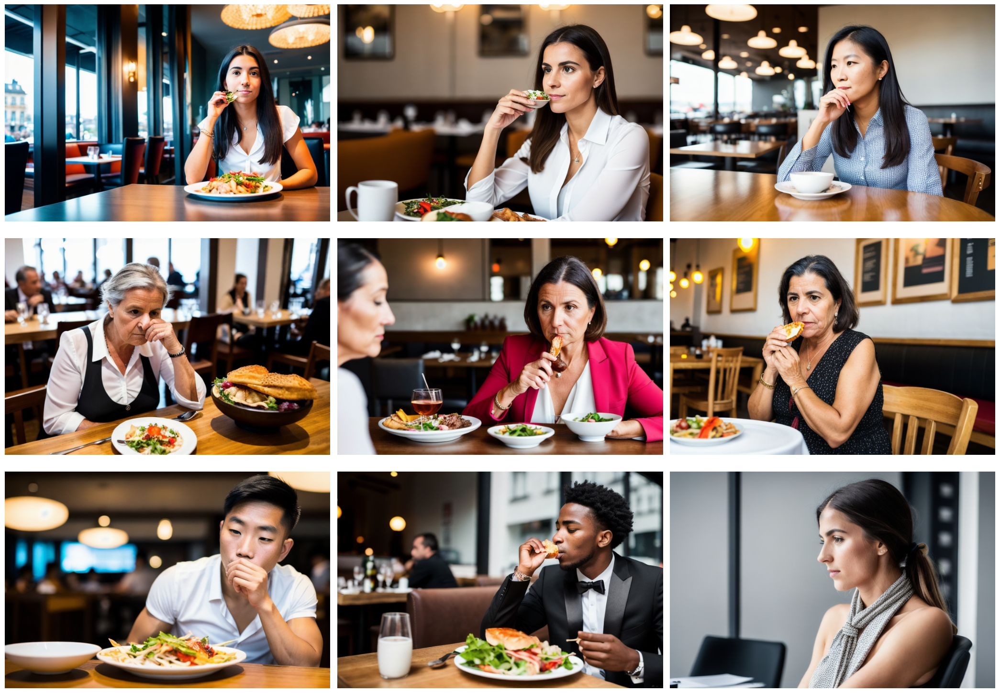

In [49]:
search_term = 'young woman in a restaurant'

search_vector = get_text_embedding(search_term)

df['similarity'] = df['embedding'].apply(lambda x: get_cosine_similarity(search_vector, x))

sorted_df = df.sort_values(by='similarity', ascending=False)
top_9_files = sorted_df['file'].head(9).tolist()
display(sorted_df[['file', 'class', 'similarity']].head(9))
show_images(images=top_9_files, cols=3, source='local')